# Explore here

In [77]:
#Librerias
import pandas as pd 
from sklearn.model_selection import train_test_split 
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.metrics import accuracy_score
from yellowbrick.cluster import KElbowVisualizer
import plotly.express as px
import nbformat
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px
from joblib import dump

In [35]:
df=pd.read_csv('https://raw.githubusercontent.com/4GeeksAcademy/k-means-project-tutorial/main/housing.csv')
df.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,4.526
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,3.585
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,3.521
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,3.413
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,3.422


In [36]:
#Seleccion de columnas
x = df[['MedInc','Latitude','Longitude']]
x.head()

,MedInc,Latitude,Longitude
0,8.3252,37.88,-122.23
1,8.3014,37.86,-122.22
2,7.2574,37.85,-122.24
3,5.6431,37.85,-122.25
4,3.8462,37.85,-122.25


In [37]:
X_train, X_test = train_test_split(x, test_size = 0.2, random_state = 42)
X_train.head()

,MedInc,Latitude,Longitude
14196,3.2596,32.71,-117.03
8267,3.8125,33.77,-118.16
17445,4.1563,34.66,-120.48
14265,1.9425,32.69,-117.11
2271,3.5542,36.78,-119.80


In [38]:
X_test.head()

,MedInc,Latitude,Longitude
20046,1.6812,36.06,-119.01
3024,2.5313,35.14,-119.46
15663,3.4801,37.80,-122.44
20484,5.7376,34.28,-118.72
9814,3.7250,36.62,-121.93


findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the fo

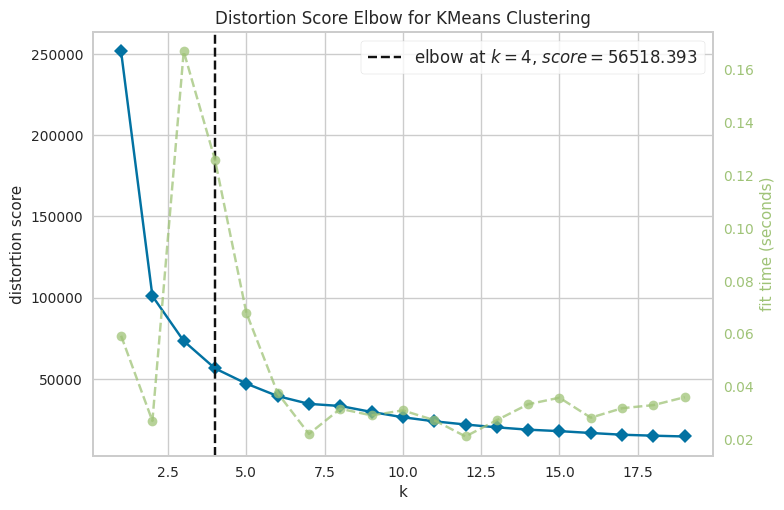

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [39]:
elbow_viz = KElbowVisualizer(KMeans(random_state=42), k=(1,20))
elbow_viz.fit(x)
elbow_viz.show()

In [40]:
#Lo distribuimos en 6 clusters como en el enunciado aunque en la frafica de elbow nos salen lo mas optiomo con 4
model = KMeans(n_clusters = 6, n_init = "auto", random_state = 42)
model.fit(X_train)

KMeans(n_clusters=6, random_state=42)

In [41]:
X_train.head()

,MedInc,Latitude,Longitude
14196,3.2596,32.71,-117.03
8267,3.8125,33.77,-118.16
17445,4.1563,34.66,-120.48
14265,1.9425,32.69,-117.11
2271,3.5542,36.78,-119.80


In [42]:
y_train = list(model.labels_)
X_train['Cluster'] = y_train

X_train.head()

,MedInc,Latitude,Longitude,Cluster
14196,3.2596,32.71,-117.03,3
8267,3.8125,33.77,-118.16,1
17445,4.1563,34.66,-120.48,1
14265,1.9425,32.69,-117.11,3
2271,3.5542,36.78,-119.80,5


findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the fo

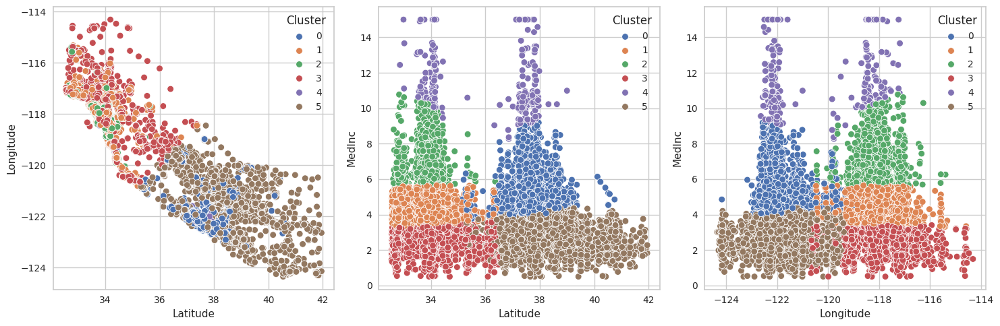

In [43]:
fig, axis = plt.subplots(1, 3, figsize = (15, 5))

sns.scatterplot(ax = axis[0], data = X_train, x = "Latitude", y = "Longitude", hue = 'Cluster', palette = "deep")
sns.scatterplot(ax = axis[1], data = X_train, x = "Latitude", y = "MedInc", hue = 'Cluster', palette = "deep")
sns.scatterplot(ax = axis[2], data = X_train, x = "Longitude", y = "MedInc", hue = 'Cluster', palette = "deep")
plt.tight_layout()

plt.show()

In [44]:


fig = px.scatter_3d(X_train, x = "Latitude", y = "Longitude", z = "MedInc", color = 'Cluster', width = 1000, height = 500,
                    size = X_train["MedInc"].abs())
camera = dict(
    up = dict(x = 1, y = 3.5, z = 0),
    eye = dict(x = 2, y = 0, z = 0)
)

fig.update_layout(scene_camera = camera)
fig.show()

In [45]:
y_test = list(model.predict(X_test))
X_test['Cluster'] = y_test
X_test.head()

,MedInc,Latitude,Longitude,Cluster
20046,1.6812,36.06,-119.01,3
3024,2.5313,35.14,-119.46,3
15663,3.4801,37.80,-122.44,5
20484,5.7376,34.28,-118.72,2
9814,3.7250,36.62,-121.93,5


findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the fo

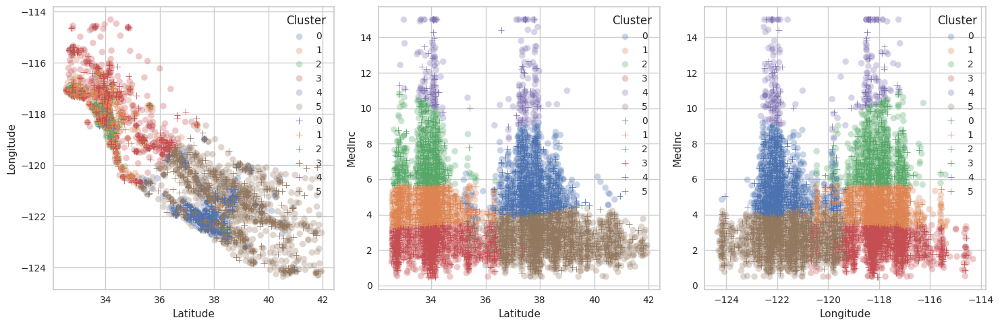

In [46]:
fig, axis = plt.subplots(1, 3, figsize = (15, 5))

sns.scatterplot(ax = axis[0], data = X_train, x = "Latitude", y = "Longitude", hue = 'Cluster', palette = "deep",alpha = 0.3)
sns.scatterplot(ax = axis[1], data = X_train, x = "Latitude", y = "MedInc", hue = 'Cluster', palette = "deep",alpha = 0.3)
sns.scatterplot(ax = axis[2], data = X_train, x = "Longitude", y = "MedInc", hue = 'Cluster', palette = "deep",alpha = 0.3)

sns.scatterplot(ax = axis[0], data = X_test, x = "Latitude", y = "Longitude", hue = 'Cluster', palette = "deep", marker='+')
sns.scatterplot(ax = axis[1], data = X_test, x = "Latitude", y = "MedInc", hue = 'Cluster', palette = "deep", marker='+')
sns.scatterplot(ax = axis[2], data = X_test, x = "Longitude", y = "MedInc", hue = 'Cluster', palette = "deep", marker='+')

plt.tight_layout()

plt.show()

In [48]:
fig = px.scatter_3d(X_train, x = "Latitude", y = "Longitude", z = "MedInc", color = 'Cluster', width = 1000, height = 500,
                    size = X_train["MedInc"].abs())
px.scatter_3d(X_test, x = "Latitude", y = "Longitude", z = "MedInc", color = 'Cluster', width = 1000, height = 500,
                    size = X_test["MedInc"].abs())
camera = dict(
    up = dict(x = 1, y = 3.5, z = 0),
    eye = dict(x = 2, y = 0, z = 0)
)

fig.update_layout(scene_camera = camera)
fig.show()

In [57]:
x.shape

(20640, 3)

In [64]:
X_train_sinclus=X_train.drop(columns='Cluster')
model_tree=DecisionTreeClassifier(min_samples_leaf=20,max_depth=3,random_state = 42)
model_tree.fit(X_train_sinclus,y_train)


DecisionTreeClassifier(max_depth=3, min_samples_leaf=20, random_state=42)

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the fo

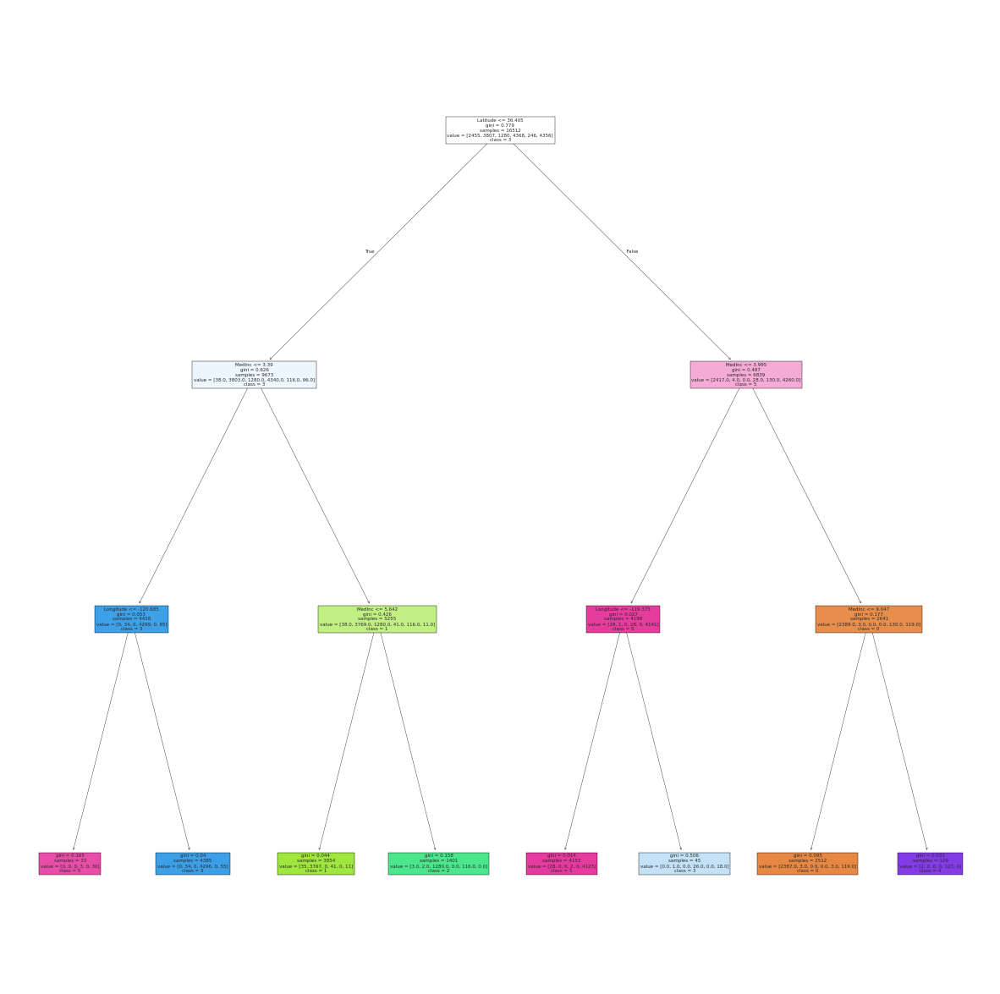

In [65]:
fig = plt.figure(figsize=(15,15))

tree.plot_tree(model_tree, feature_names = list(X_train.columns), class_names = ["0", "1", "2", "3", "4", "5"], filled = True)

plt.show()

In [67]:
X_test_sinclus=X_test.drop(columns='Cluster')
y_pred = model_tree.predict(X_test_sinclus)
y_pred

array([3, 3, 5, ..., 4, 5, 1], dtype=int32)

In [68]:
accuracy_score(y_test, y_pred)

0.970203488372093

In [80]:

dump(model, open("/workspaces/Hector-K-means-python/models/k-means.sav", "wb"))
dump(model_tree, open("/workspaces/Hector-K-means-python/models/decision_tree.sav", "wb"))